In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import norm
from sklearn.preprocessing import StandardScaler
from scipy import stats
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [3]:
df_train = pd.read_csv('[new] yancheng_train_20171226.csv')

In [4]:
df_train.columns

Index(['sale_date', 'class_id', 'sale_quantity', 'brand_id', 'compartment',
       'type_id', 'level_id', 'department_id', 'TR', 'gearbox_type',
       'displacement', 'if_charging', 'price_level', 'price', 'driven_type_id',
       'fuel_type_id', 'newenergy_type_id', 'emission_standards_id',
       'if_MPV_id', 'if_luxurious_id', 'power', 'cylinder_number',
       'engine_torque', 'car_length', 'car_width', 'car_height',
       'total_quality', 'equipment_quality', 'rated_passenger', 'wheelbase',
       'front_track', 'rear_track'],
      dtype='object')

In [5]:
# descriptive statistics summary
df_train["sale_quantity"].describe()

count    20157.00000
mean       126.31205
std        231.13742
min          5.00000
25%         16.00000
50%         47.00000
75%        142.00000
max       6284.00000
Name: sale_quantity, dtype: float64

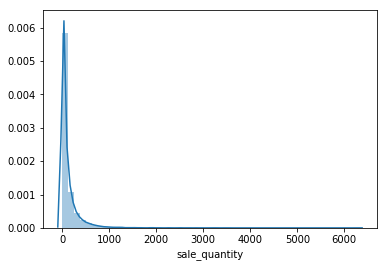

In [6]:
#histogram
sns.distplot(df_train['sale_quantity'])

In [7]:
#skewness and kurtosis(＃偏度和峰度)
print('Skewness: %f'% df_train['sale_quantity'].skew())
print('Kurtosis: %f'% df_train['sale_quantity'].kurt())

Skewness: 6.106669
Kurtosis: 69.185909


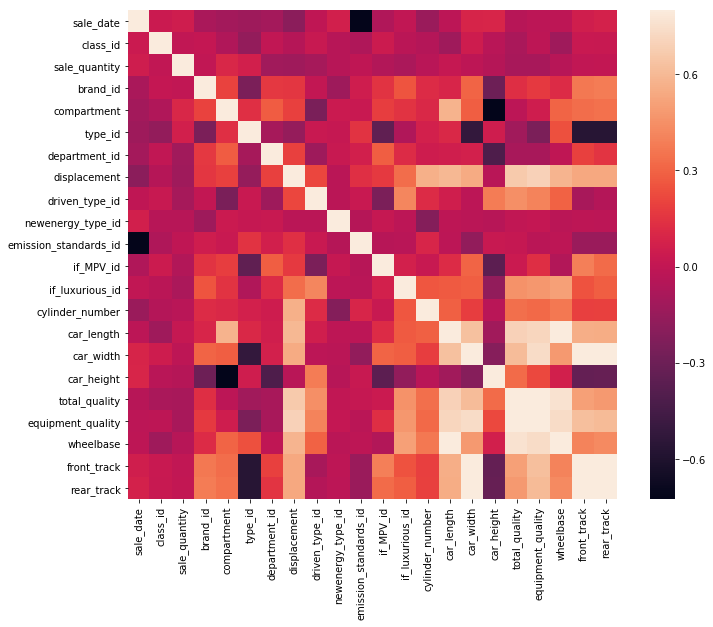

In [8]:
corrmat = df_train.corr()
f,ax = plt.subplots(figsize=(12,9))
sns.heatmap(corrmat,vmax=.8,square=True)

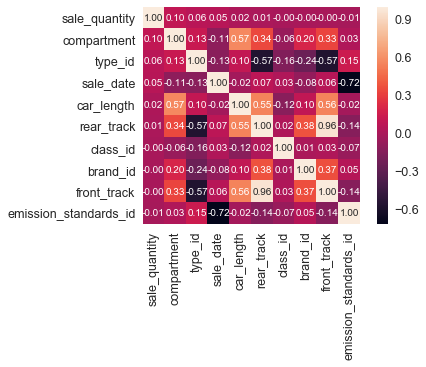

In [9]:
#saleprice correlation matrix
k = 10 #number of variables for heatmap
cols = corrmat.nlargest(k, 'sale_quantity')['sale_quantity'].index
cm = np.corrcoef(df_train[cols].values.T)
sns.set(font_scale=1.25)
hm = sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10}, yticklabels=cols.values, xticklabels=cols.values)
plt.show()

In [10]:
df_test = pd.read_csv('yancheng_testA_20171225.csv')

In [11]:
df_test.head()

,predict_date,class_id,predict_quantity
0,201711,103507,NaN
1,201711,124140,NaN
2,201711,125403,NaN
3,201711,136916,NaN
4,201711,169673,NaN


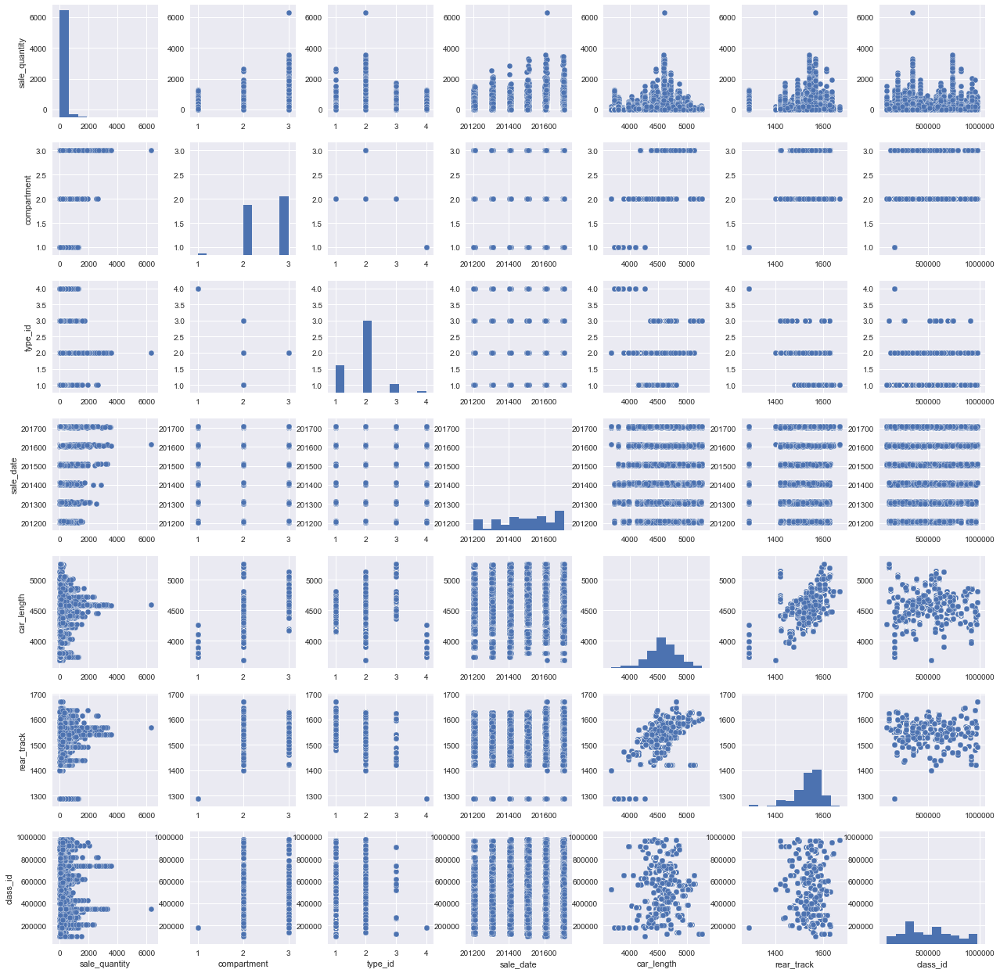

In [12]:
#scatterplot
sns.set()
cols = ['sale_quantity', 'compartment', 'type_id', 'sale_date', 'car_length', 'rear_track', 'class_id']
sns.pairplot(df_train[cols],size=2.5)
plt.show()

In [13]:
# missing data
total = df_train.isnull().sum().sort_values(ascending=False)
percent = (df_train.isnull().sum()/df_train.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total,percent],axis=1,keys=['Total','Percent'])
missing_data.head(20)

,Total,Percent
rear_track,0,0.0
front_track,0,0.0
class_id,0,0.0
sale_quantity,0,0.0
brand_id,0,0.0
compartment,0,0.0
type_id,0,0.0
level_id,0,0.0
department_id,0,0.0
TR,0,0.0


# the follows is show the each class_id the relationship between sale_date and sale_quantity

In [15]:
df_train_feature1=pd.concat([df_train['class_id'],df_train['sale_date'],df_train['sale_quantity']],axis=1)

In [16]:
#s=df_train_feature1[df_train_feature1['class_id'] ==175962]

In [17]:
# plt.scatter(s['sale_date'],s['sale_quantity'],label='175962')
# plt.legend()

In [18]:
class_id =[]
for i in df_train_feature1.class_id:
    class_id.append(i)
class_id = list(set(class_id))

In [19]:
#df_train_feature1[df_train_feature1['class_id'] ==651782]

In [20]:
data_s=[]
for i in df_train_feature1['sale_date']:
    i = str(i)
    s=i[2:4]+'-'+i[-2:]
    data_s.append(s)

In [21]:
df_train_feature1['date_s']=data_s

In [22]:
# for i in class_id:
#     s=df_train_feature1[df_train_feature1['class_id'] ==i]
#     plt.figure(figsize=(40,5))
#     plt.scatter(s['date_s'],s['sale_quantity'],label=i)
#     plt.legend()
#     plt.show()

In [23]:
df_train_feature1['cloumn_id']=range(20157)

In [24]:
df_train_feature1['date_str']=df_train_feature1['date_s']

### make the multi same 'class_id and date_s' lines by adding sale_quantity become one line

In [25]:
g=df_train_feature1.groupby(['class_id','date_s']).sum()
g

sale_date  sale_quantity  cloumn_id
class_id date_s                                     
103507   15-03      604509             58      28699
         15-04     1209024            232      61067
         15-05     1209030            226      62505
         15-06     1410542            286      85210
         15-07     1209042            297      63907
         15-08      806032            355      48908
         15-09     1410563            442      95604
         15-10     1209060           1050      83574
         15-11     1209066            481      65595
         15-12     1007560           1433      64000
         16-01     1814409            993     160672
         16-02     1612816            953     146057
         16-03     1411221            650     130295
         16-04      403208            145      37227
         16-05      806420            772      76179
         16-06      806424            829      77921
         16-07      806428            378      78442
         16-08      604824            406      59709
         16-09      604827            684       1301
         16-10      604830            632       1068
         16-11      604833            876       3502
         16-12      403224           1653       3214
         17-01      403402            499       4614
         17-02      403404            435       3938
         17-03      605109            371       6973
         17-04      403408            290       4619
         17-05      403410            429       6592
         17-06      403412            371       8756
         17-07      403414            313       8053
         17-08      403416            180       7286
...                    ...            ...        ...
978089   15-05     1007525            418      52191
         15-06     1007530            372      58182
         15-07     1209042            428      72066
         15-08     1007540            503      53188
         15-09     1410563            753      77925
         15-10     1410570            790      78620
         15-11     1410577            659      86362
         15-12     1209072           1284      67075
         16-01     1008005            651      88187
         16-02     1008010            623      90049
         16-03     1209618            605     110681
         16-04     1411228            604     130795
         16-05     1209630            735     114594
         16-06     1008030            474      95949
         16-07      806428            530      78282
         16-08      806432            521      79309
         16-09      806436            474       1141
         16-10     1008050            503       2769
         16-11      806444            400       4718
         16-12      806448           1042       5743
         17-01      806804            558       5986
         17-02      806808            494       7468
         17-03      806812            548       8326
         17-04      806816            466      10930
         17-05      806820            512      13526
         17-06      806824            381      13555
         17-07      806828            270      13321
         17-08      806832            419      14043
         17-09      806836            401      18080
         17-10      403420            400       8266

[5587 rows x 3 columns]

### after groupby,i found index and values property
#### index is groupby key
#### values is groupby value

In [26]:
g.index[0]

(103507, '15-03')

In [27]:
g.values[3]

array([1410542,     286,   85210])

# 重塑列表

In [28]:


class_id_new=[]
date_s_new=[]
sale_quantity_new=[]
for i in range(len(g)):
    class_id_new.append(g.index[i][0])
    date_s_new.append(g.index[i][1])
    sale_quantity_new.append(g.values[i][1])

In [29]:
class_id_new=np.array(class_id_new)
date_s_new=np.array(date_s_new)
sale_quantity_new=np.array(sale_quantity_new)

In [30]:
df_train_feature2=pd.DataFrame({'class_id_new':class_id_new,'date_s_new':date_s_new,'sale_quantity_new':sale_quantity_new})

#### the data which has the same 'class_id and sale_date' become a row, I add them together

In [31]:
df_train_feature2

,class_id_new,date_s_new,sale_quantity_new
0,103507,15-03,58
1,103507,15-04,232
2,103507,15-05,226
3,103507,15-06,286
4,103507,15-07,297
5,103507,15-08,355
6,103507,15-09,442
7,103507,15-10,1050
8,103507,15-11,481
9,103507,15-12,1433


### show the each class_id,the relaitonship between sale_date and sale_quantity

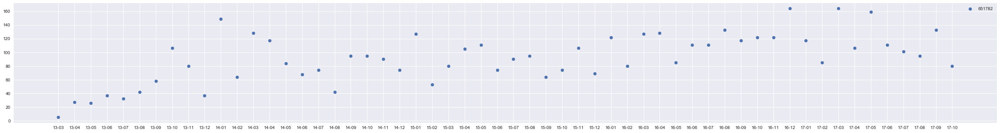

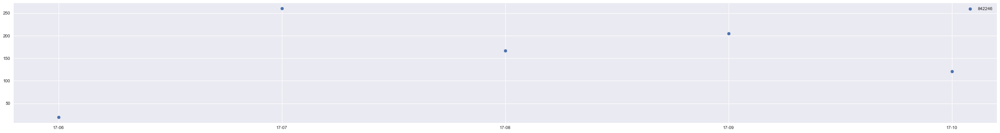

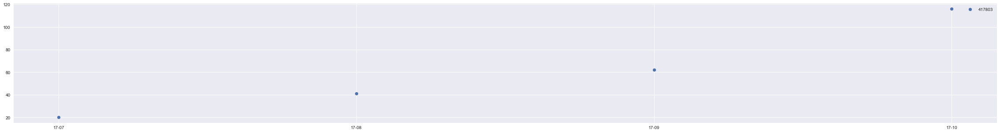

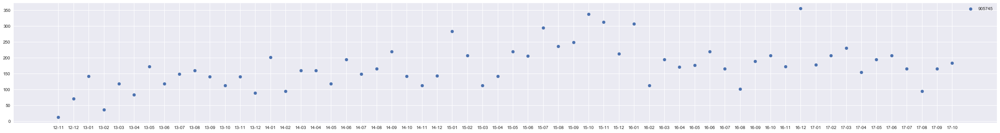

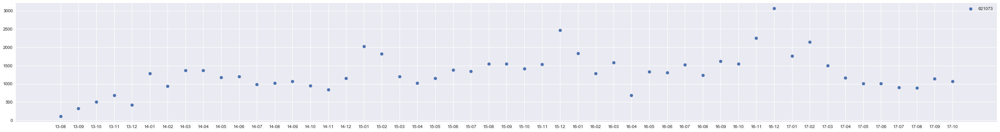

...

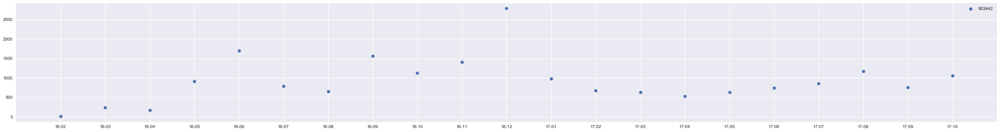

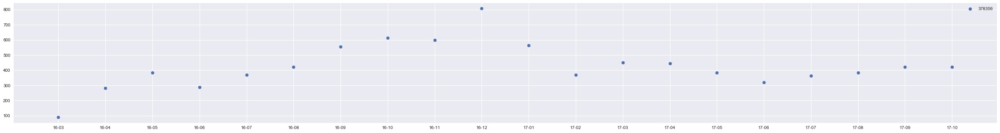

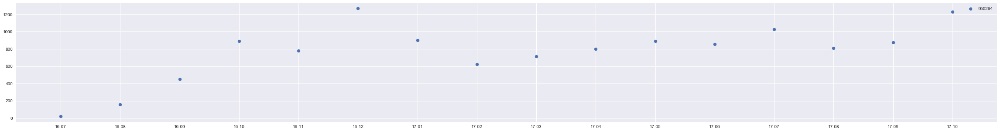

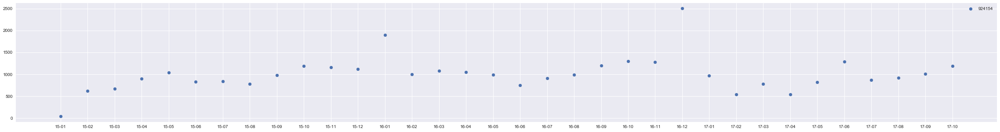

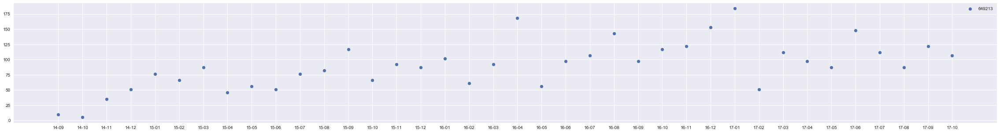

In [32]:
for i in class_id:
    s=df_train_feature2[df_train_feature2['class_id_new'] ==i]
    plt.figure(figsize=(40,5))
    plt.scatter(s['date_s_new'],s['sale_quantity_new'],label=i)
    plt.legend()
    plt.show()

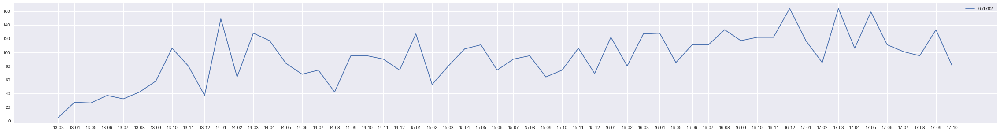

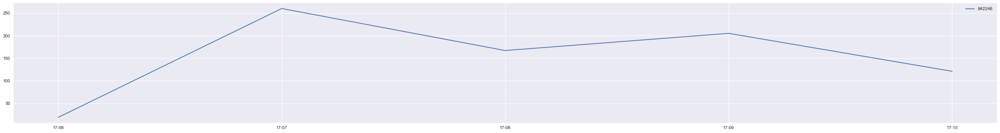

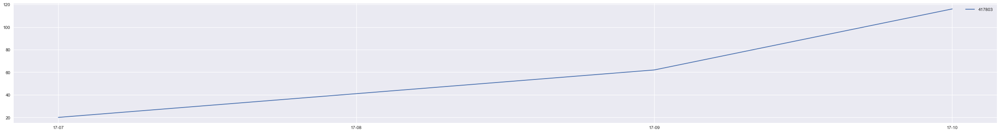

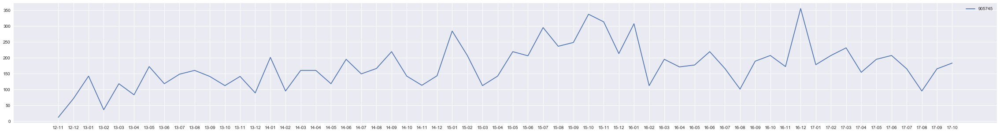

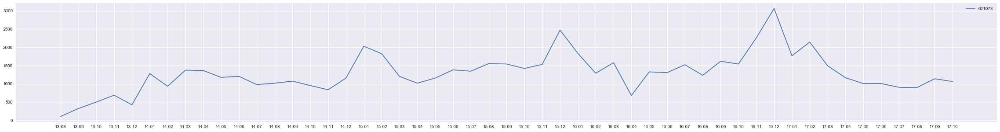

...

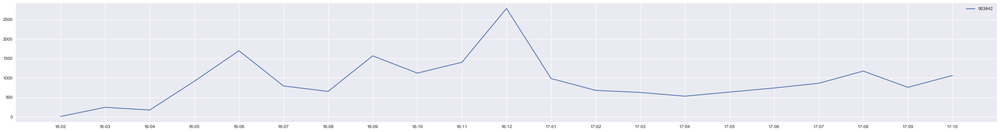

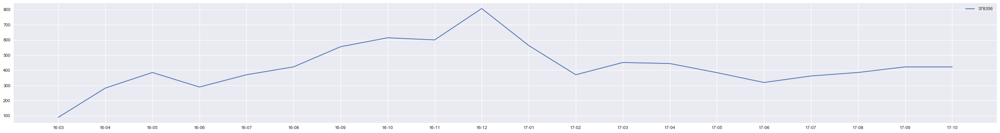

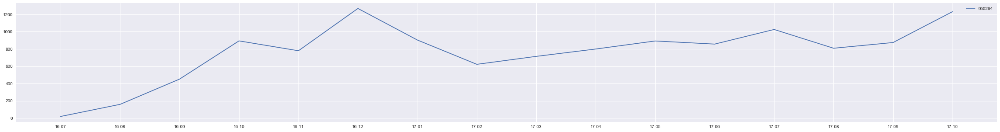

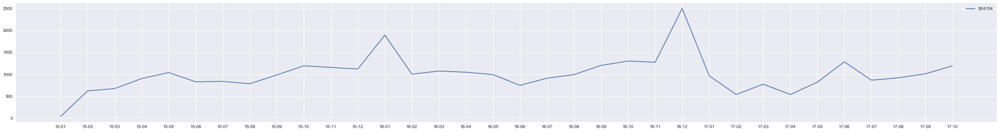

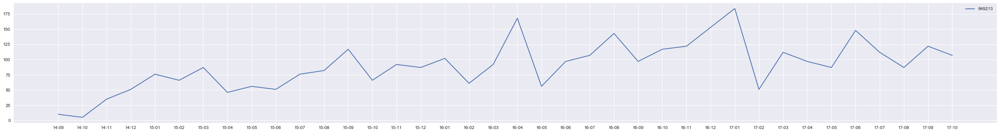

In [33]:
for i in class_id:
    s=df_train_feature2[df_train_feature2['class_id_new'] ==i]
    plt.figure(figsize=(40,5))
    plt.plot(s['date_s_new'],s['sale_quantity_new'],label=i)
    plt.legend()
    plt.show()

In [145]:
len(class_id)

140

In [34]:
# transform date as int

In [37]:
date_int=[]
for i in df_train_feature2['date_s_new']:
    s=i[:2]+i[3:]
    s = int(s)
    date_int.append(s)

In [41]:
#将年月换算成数字，以10年1月为基准；14年10月换算成数字就是：（14-10）*12+10=58，目的：数字化标签

In [39]:
date_num=[]
for i in df_train_feature2['date_s_new']:
    s1=int(i[:2])
    s2=int(i[3:])
    s=(s1-10)*12+s2
    date_num.append(s)

In [42]:
df_train_feature2['date_num']=date_num

In [43]:
# 应用模型训练

,class_id_new,date_s_new,sale_quantity_new,date_num
0,103507,15-03,58,63
1,103507,15-04,232,64
2,103507,15-05,226,65
3,103507,15-06,286,66
4,103507,15-07,297,67
5,103507,15-08,355,68
6,103507,15-09,442,69
7,103507,15-10,1050,70
8,103507,15-11,481,71
9,103507,15-12,1433,72


In [44]:
import xgboost as xgb
from xgboost.sklearn import XGBClassifier
from sklearn.model_selection import cross_val_score

In [88]:
# for i in class_id:
#     s=df_train_feature2[df_train_feature2['class_id_new'] ==i]
#     X=s['date_num']
#     y=s['sale_quantity_new']
#     gbm = xgb.XGBClassifier(max_depth=5, n_estimators=300, learning_rate=0.05)
#     scores = cross_val_score(gbm,X,y,cv=2)
#     print('class_id is :'+i+'socors mean is:'+scores.mean())

# xgboost predict for each class_id

In [57]:
dic_classid={}
for i in class_id:
    s=df_train_feature2[df_train_feature2['class_id_new'] ==i]
    X=s['date_num'].reshape(-1,1)#attention:reshape is the just match for xgboost input format
    y=s['sale_quantity_new']
    gbm = xgb.XGBClassifier(max_depth=5, n_estimators=300, learning_rate=0.05)
    gbm.fit(X,y)
    predictions =gbm.predict(95)# 2017.11 is (2017-2010)*12+11=95
    dic_classid[i]=predictions

In [55]:
s['date_num'].shape

(56,)

In [56]:
s['sale_quantity_new'].shape

(56,)

## change dic_classid.value from np type to int type

In [73]:
for i in class_id:
    dic_classid[i]=int(dic_classid[i])

# put the predicts into test

In [86]:
for i in class_id:
    df_test.loc[df_test['class_id']==i,'predict_quantity']=dic_classid[i]
        

In [104]:
df_test.to_csv("../../raw/Woody/car_sale_submition1.csv", index=False)

### 对于小于11个月数据的，个人觉得需要特殊处理

### 查看小于11个月的数据有哪些

In [112]:
class_num_dataset=[]
for i in class_id:
    class_id_num=df_train_feature2[df_train_feature2['class_id_new']==i]
    class_num=len(class_id_num)
    if class_num < 11:#只在2017年产生的数据
        class_num_dataset.append(i)

In [113]:
class_num_dataset

[842246,
 417803,
 854548,
 760412,
 653436,
 815230,
 725137,
 194201,
 687270,
 612523,
 169673,
 340175,
 872180,
 861459,
 789290,
 437063,
 890189,
 905061,
 376193,
 714150,
 359378]

#### 抽出小于11个月数据，查看日期和销量的关系

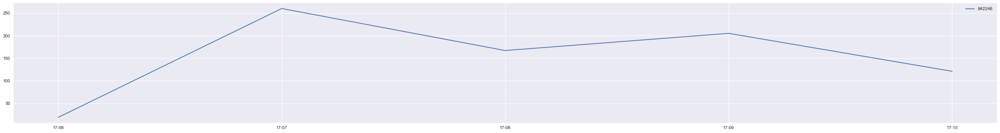

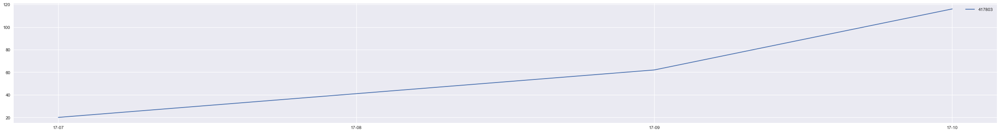

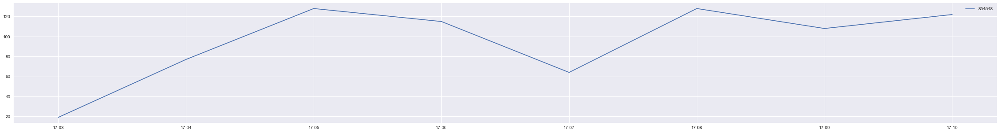

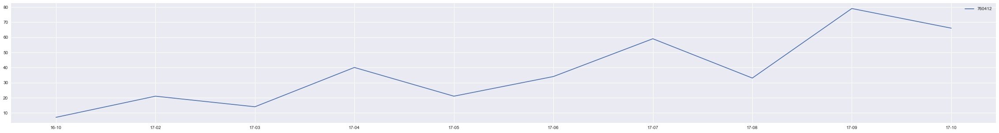

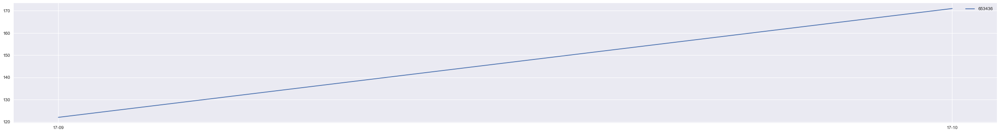

...

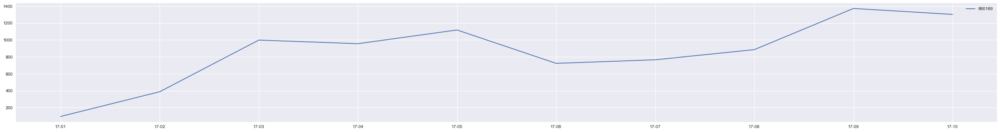

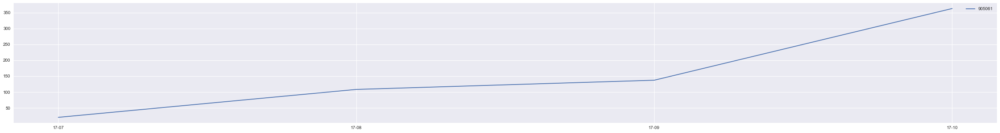

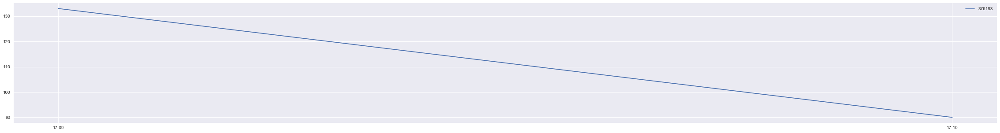

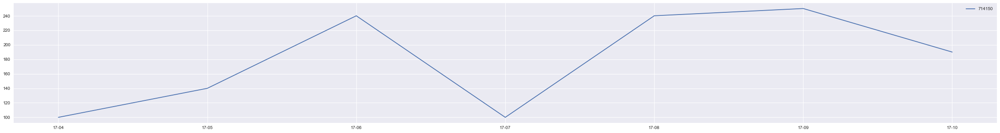

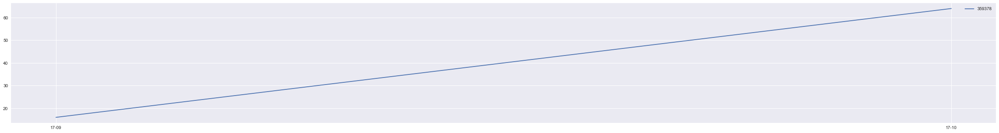

In [114]:
for i in class_num_dataset:
    s=df_train_feature2[df_train_feature2['class_id_new'] ==i]
    plt.figure(figsize=(40,5))
    plt.plot(s['date_s_new'],s['sale_quantity_new'],label=i)
    plt.legend()
    plt.show()

#### 观察完成之后，打算对小于11个月的数据，取平均值处理

#### groupby的方法

In [115]:
g_mean=df_train_feature2.groupby('class_id_new').mean()
g_mean

,sale_quantity_new,date_num
class_id_new,,
103507,533.906250,78.500000
124140,267.547619,73.500000
125403,175.428571,59.500000
136916,312.100000,59.500000
169673,116.200000,92.000000
175962,349.898305,65.000000
178529,588.642857,59.500000
186250,128.666667,84.000000
194201,308.500000,93.500000


In [117]:
g_mean.index

Int64Index([103507, 124140, 125403, 136916, 169673, 175962, 178529, 186250,
            194201, 194450,
            ...
            923841, 924154, 948936, 950264, 953842, 961362, 961962, 963845,
            973106, 978089],
           dtype='int64', name='class_id_new', length=140)

In [118]:
g_mean.values

array([[  533.90625   ,    78.5       ],
       [  267.54761905,    73.5       ],
       [  175.42857143,    59.5       ],
       [  312.1       ,    59.5       ],
       [  116.2       ,    92.        ],
       [  349.89830508,    65.        ],
       [  588.64285714,    59.5       ],
       [  128.66666667,    84.        ],
       [  308.5       ,    93.5       ],
       [  109.97101449,    59.37681159],
       [   77.8490566 ,    63.32075472],
       [ 1293.17857143,    80.5       ],
       [  308.51428571,    59.5       ],
       [  213.20512821,    75.        ],
       [  237.38181818,    67.        ],
       [  101.57894737,    85.        ],
       [  930.04285714,    59.5       ],
       [  136.5       ,    88.5       ],
       [  140.35      ,    84.5       ],
       [  287.08695652,    60.        ],
       [  957.02941176,    77.5       ],
       [  735.62857143,    59.5       ],
       [  289.95121951,    74.        ],
       [  342.73170732,    74.        ],
       [  214.72

In [126]:
q_list=[]
for i in g_mean.values:
    s_=int(i[0])
    q_list.append(s_)

#### 重塑table，只有class_id 和 sale_quantity的平均数

In [128]:
df_train_feature_mean=pd.DataFrame({'class_id':g_mean.index,'sale_mean':q_list})

### 测试一下如何去具体值

In [132]:
df_train_feature_mean[df_train_feature_mean['class_id']==103507]['sale_mean']

0    533
Name: sale_mean, dtype: int64

### 将小于11个月份的销量平均值赋予test

In [133]:
for i in class_num_dataset:
    df_test.loc[df_test['class_id']==i,'predict_quantity']=df_train_feature_mean[df_train_feature_mean['class_id']==i]['sale_mean']

## 验证一下
#### 销售月份小于11个的月的class_id,按照平均值

In [134]:
 df_test.loc[df_test['class_id']==861459,'predict_quantity']

122    209.0
Name: predict_quantity, dtype: float64

In [135]:
df_train_feature_mean[df_train_feature_mean['class_id']==861459]['sale_mean']

122    209
Name: sale_mean, dtype: int64

#### 销售月份大于等于11个的月的class_id,按照xgboost预测值

In [136]:
 df_test.loc[df_test['class_id']==103507,'predict_quantity']

0    180.0
Name: predict_quantity, dtype: float64

In [137]:
df_train_feature_mean[df_train_feature_mean['class_id']==103507]['sale_mean']

0    533
Name: sale_mean, dtype: int64

# save

In [138]:
df_test.to_csv("../../raw/Woody/car_sale_submition2.csv", index=False)